# SETUP

## Mounting and installations

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip -q install kaggle

In [ ]:
!pip -q install linformer-pytorch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 117.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 92.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 59.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 17.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 39.3 MB/s eta 0:00:00


## Imports

In [ ]:
from linformer_pytorch import Linformer

In [ ]:
import os
import glob
import json
import cv2
import zipfile
import functools
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from sklearn.model_selection import train_test_split
import matplotlib.image as img
import pandas as pd
from io import BytesIO
from google.colab import userdata
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

In [ ]:
import torch
from tqdm import tqdm
import torch.nn as nn
from torch.nn.functional import relu
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms, models
from PIL import Image
import gradio as gr

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

## Kaggle setup and downloads

In [ ]:
def get_kaggle_credentials():
  kaggle_dir = os.path.expanduser("~/.kaggle")
  kaggle_json_drive_path = "/content/drive/MyDrive/kaggle/kaggle.json"
  kaggle_json_local_path = os.path.join(kaggle_dir, "kaggle.json")

  if not os.path.exists(kaggle_dir):
      os.makedirs(kaggle_dir)

  if not os.path.isfile(kaggle_json_drive_path):
      raise FileNotFoundError("kaggle.json not found in /content/drive/MyDrive/kaggle/. " )

  with open(kaggle_json_drive_path, "r") as src:
      creds = json.load(src)

  with open(kaggle_json_local_path, "w") as dst:
      json.dump(creds, dst)

  os.chmod(kaggle_json_local_path, 0o600)

In [ ]:
get_kaggle_credentials()

In [ ]:
!kaggle datasets download -d mateuszbuda/lgg-mri-segmentation #nikhilroxtomar/brain-tumor-segmentation #masoudnickparvar/brain-tumor-mri-dataset # denizkavi1/brain-tumor # navoneel/brain-mri-images-for-brain-tumor-detection

Dataset URL: https://www.kaggle.com/datasets/mateuszbuda/lgg-mri-segmentation
License(s): CC-BY-NC-SA-4.0
 99% 704M/714M [00:03<00:00, 112MB/s] 
100% 714M/714M [00:03<00:00, 195MB/s]


In [ ]:
target_dir = "/content/drive/MyDrive/Datasets/brain-tumor-mri-dataset"
with zipfile.ZipFile("lgg-mri-segmentation.zip", "r") as zip_ref:
    zip_ref.extractall('lgg-mri-segmentation') # ('brain-tumor-mri-dataset') # (target_dir)

In [ ]:
def dir_struct(start_path):
  for root, dirs, files in os.walk(start_path):
        level = root.replace(start_path, '').count(os.sep)
        indent = ' ' * 4 * level
        print(f"{indent}{os.path.basename(root)}/")
        subindent = ' ' * 4 * (level + 1)
        for f in files[:5]:  # Show first 5 files per folder
            print(f"{subindent}{f}")
        if len(files) > 5:
            print(f"{subindent}... ({len(files) - 5} more files)")

In [ ]:
print("\n📂 Directory Structure of Extracted Dataset:")
dir_struct('lgg-mri-segmentation') #('brain-tumor-mri-dataset')
# dir_struct(target_dir)


📂 Directory Structure of Extracted Dataset:
lgg-mri-segmentation/
    lgg-mri-segmentation/
        kaggle_3m/
            data.csv
            README.md
            TCGA_FG_6690_20020226/
                TCGA_FG_6690_20020226_42_mask.tif
                TCGA_FG_6690_20020226_54.tif
                TCGA_FG_6690_20020226_56.tif
                TCGA_FG_6690_20020226_59_mask.tif
                TCGA_FG_6690_20020226_31.tif
                ... (115 more files)
            TCGA_FG_A4MU_20030903/
                TCGA_FG_A4MU_20030903_25_mask.tif
                TCGA_FG_A4MU_20030903_17_mask.tif
                TCGA_FG_A4MU_20030903_2.tif
                TCGA_FG_A4MU_20030903_34.tif
                TCGA_FG_A4MU_20030903_14.tif
                ... (67 more files)
            TCGA_FG_A60K_20040224/
                TCGA_FG_A60K_20040224_23.tif
                TCGA_FG_A60K_20040224_22_mask.tif
                TCGA_FG_A60K_20040224_30.tif
                TCGA_FG_A60K_20040224_33.tif
             

## Dataset helper functions

In [ ]:
DEFAULT_EXTENSIONS = ('.png', '.jpg', '.jpeg', '.tif', '.tiff')

def get_image_paths(root_dir, extensions=None):
    if extensions is None:
        extensions = DEFAULT_EXTENSIONS

    image_paths = []
    for dirpath, dirnames, filenames in os.walk(root_dir):
        for fname in filenames:
            if fname.lower().endswith(extensions):
                image_paths.append(os.path.join(dirpath, fname))
    return image_paths

def load_image_as_rgb(path):
    img = Image.open(path)
    if img.mode != 'RGB':
        img = img.convert('RGB')
    return img

In [ ]:
def pair_images_and_masks(paths):
    originals = {}
    masks = {}
    for p in paths:
        fname = os.path.basename(p)
        name, _ = os.path.splitext(fname)
        if name.endswith('_mask'):
            key = name.replace('_mask', '')
            masks[key] = p
        else:
            originals[name] = p

    pairs = []
    for key, img_path in originals.items():
        mask_path = masks.get(key)
        if mask_path:
            pairs.append((img_path, mask_path))
    return pairs

In [ ]:
def plot_image_and_mask(image_path, mask_path):
    # Plot original image and its mask side by side.
    
    img = load_image_as_rgb(image_path)
    mask = load_image_as_rgb(mask_path)

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(img)
    axes[0].set_title(f"Image: {os.path.basename(image_path)}")
    axes[0].axis('off')

    axes[1].imshow(mask)
    axes[1].set_title(f"Mask: {os.path.basename(mask_path)}")
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
img_paths = get_image_paths('lgg-mri-segmentation')

In [ ]:
root_dir = 'lgg-mri-segmentation'
pairs = pair_images_and_masks(img_paths)
print(f"Total pairs: {len(pairs)}, type: {type(pairs)}")

Total pairs: 3929, type: <class 'list'>


# Viewing images and masks

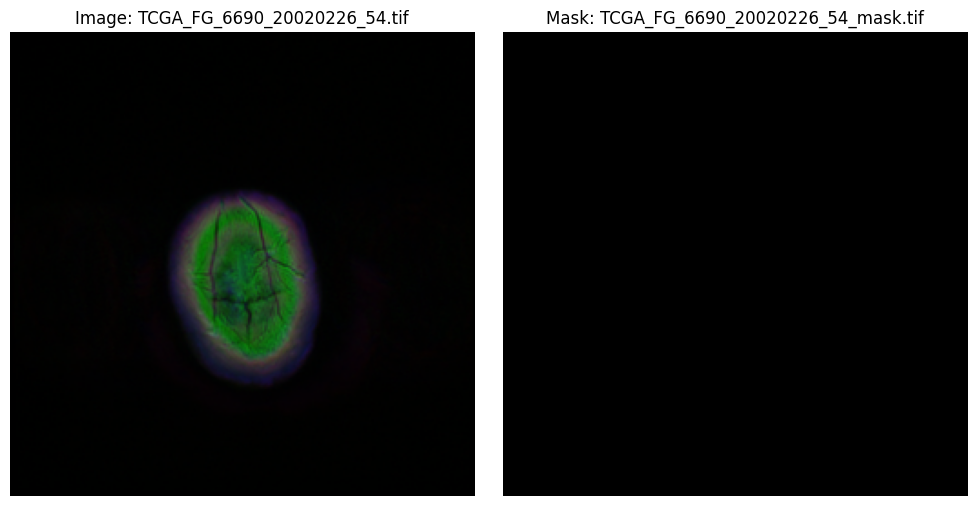

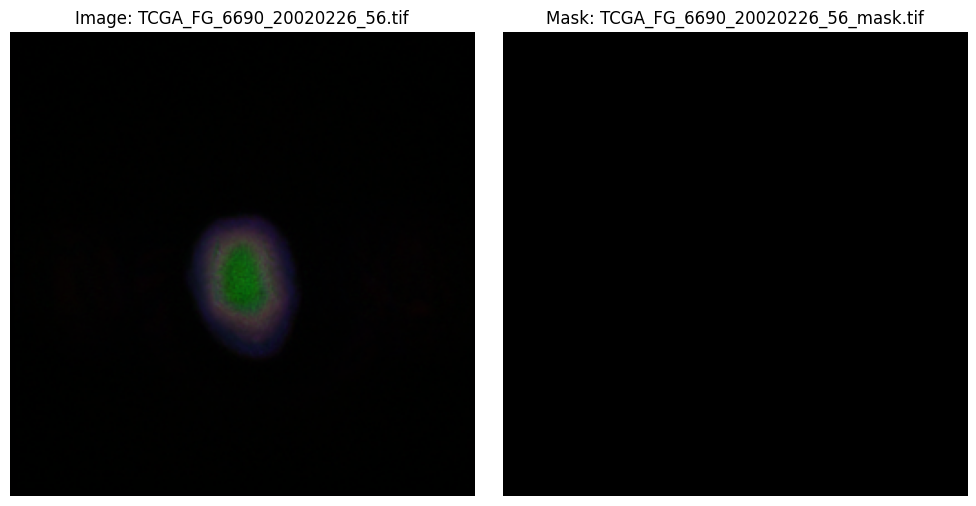

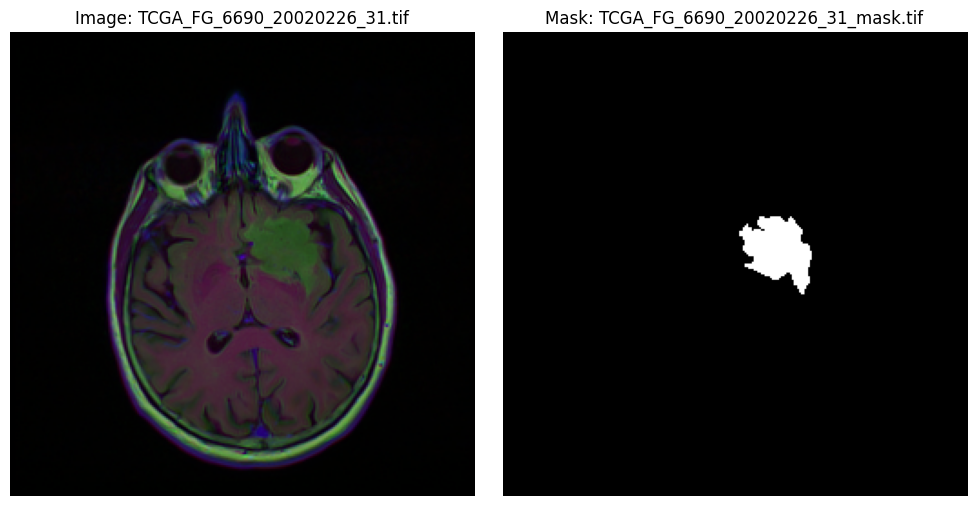

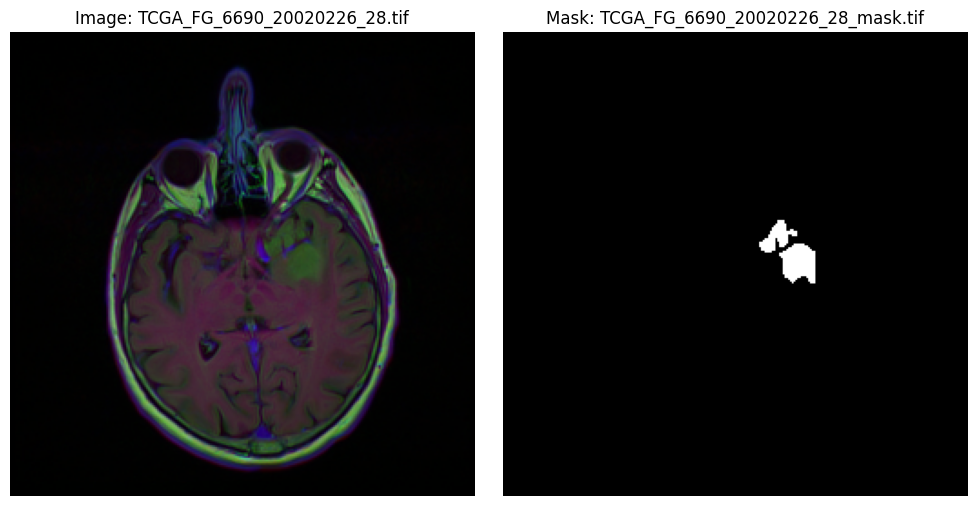

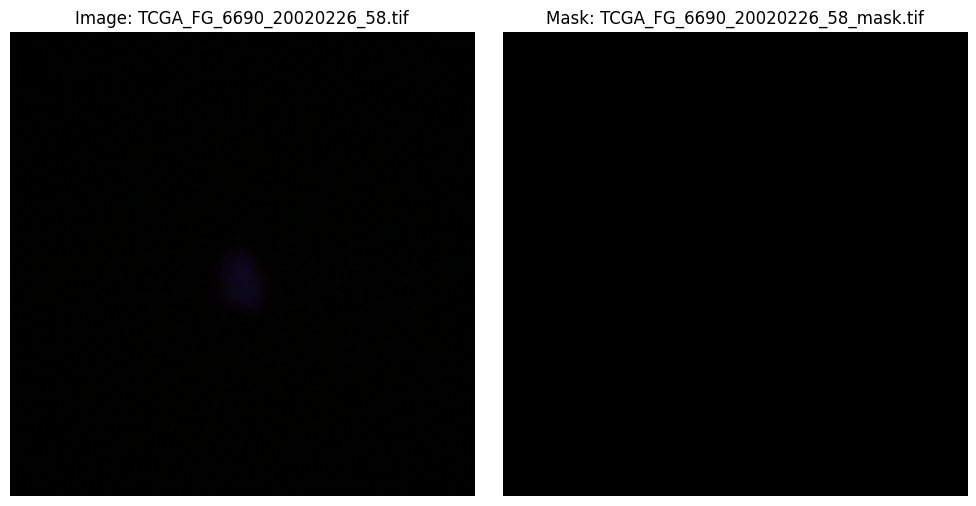

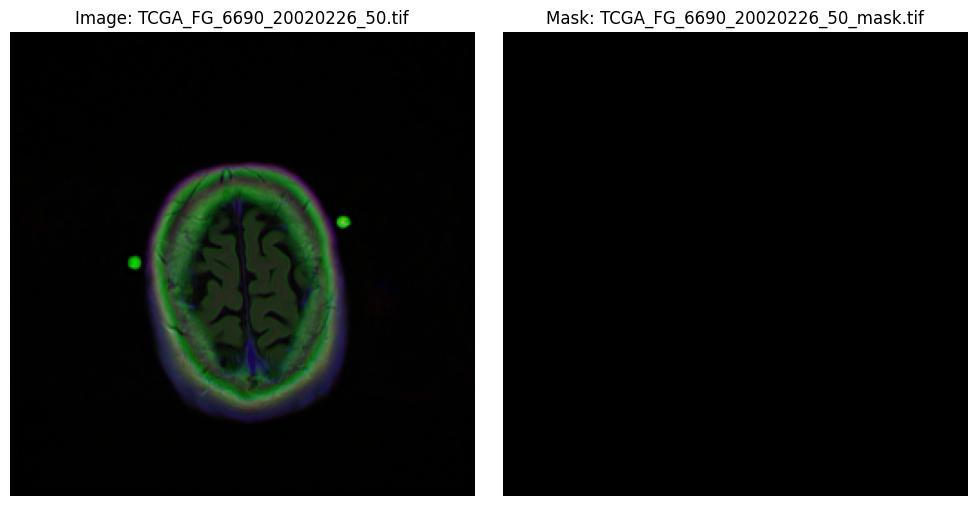

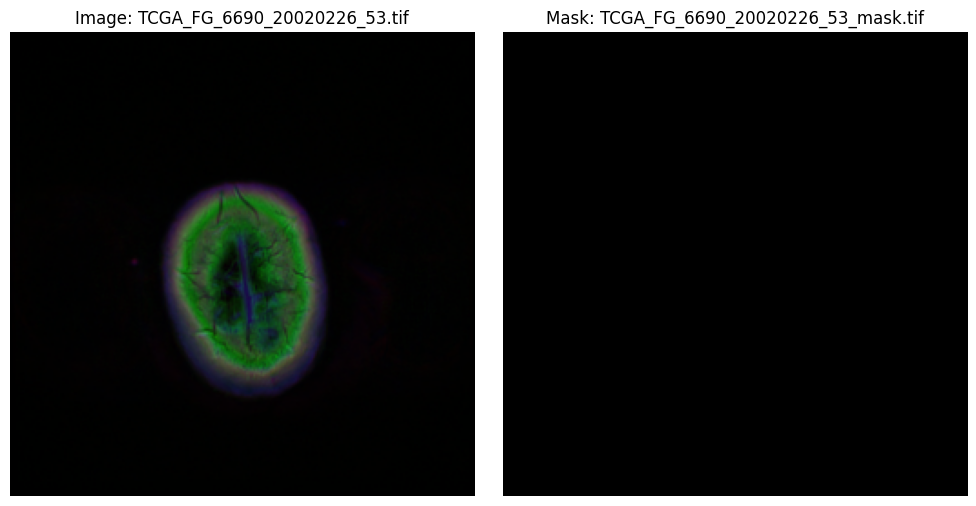

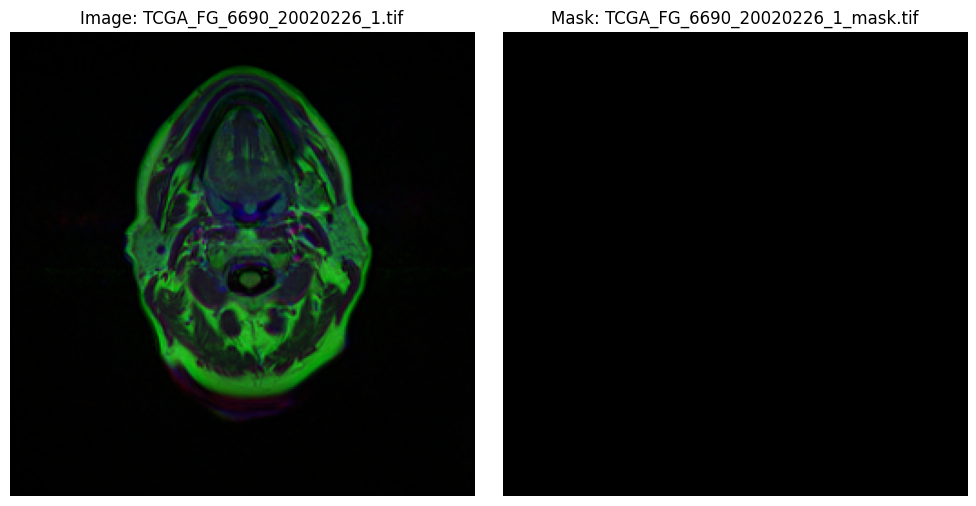

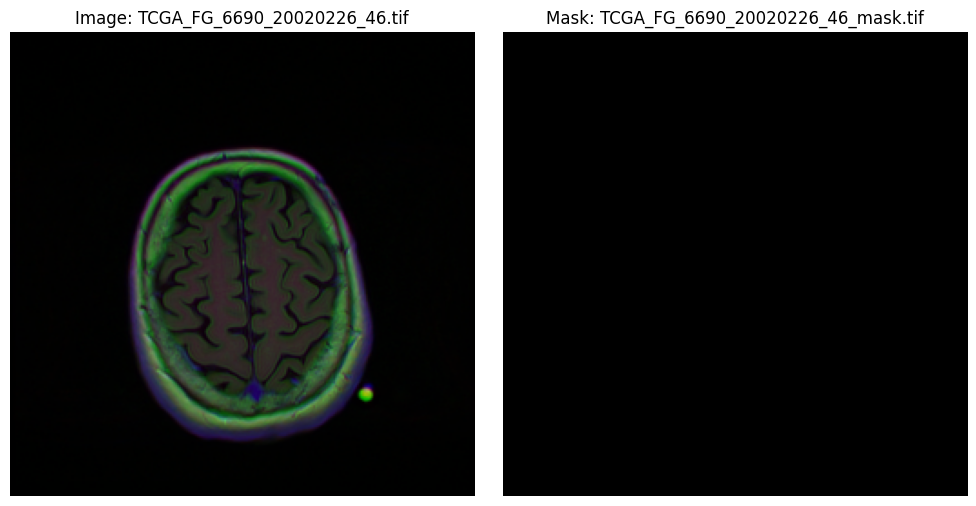

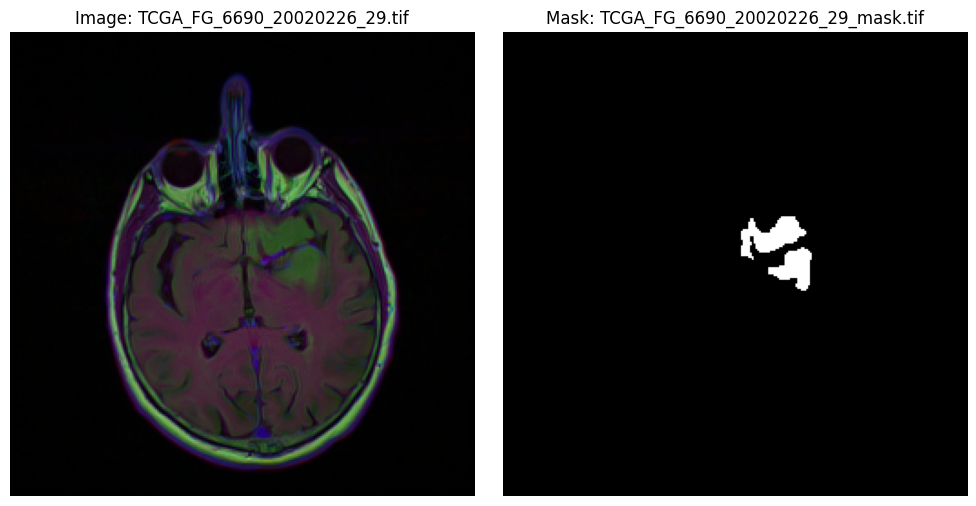

In [ ]:
for img_path, mask_path in pairs[:10]:
    plot_image_and_mask(img_path, mask_path)

In [ ]:
def diagnosis(mask_path):
    """Returns 1 if any non-zero pixel in mask indicates tumor present, else 0."""
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    return 1 if np.max(mask) > 0 else 0

def build_dataframe(paths):
    """
    Build a DataFrame with image_path, mask_path, and diagnosis label.
    Expects mask filenames to end with '_mask' before extension.
    """
    image_files, mask_files = [], []
    for p in paths:
        name = os.path.splitext(os.path.basename(p))[0]
        if name.endswith('_mask'):
            mask_files.append(p)
        else:
            image_files.append(p)

    # Pair by filename prefix
    pairs = []
    for img in image_files:
        key = os.path.splitext(os.path.basename(img))[0]
        mpath = next((m for m in mask_files if os.path.basename(m).startswith(key)), None)
        if mpath:
            pairs.append((img, mpath))

    df = pd.DataFrame(pairs, columns=['image_path', 'mask_path'])
    df['diagnosis'] = df['mask_path'].apply(diagnosis)
    return df

In [ ]:
df = build_dataframe(img_paths)

In [ ]:
df

,image_path,mask_path,diagnosis
0,lgg-mri-segmentation/lgg-mri-segmentation/kagg...,lgg-mri-segmentation/lgg-mri-segmentation/kagg...,0
1,lgg-mri-segmentation/lgg-mri-segmentation/kagg...,lgg-mri-segmentation/lgg-mri-segmentation/kagg...,0
2,lgg-mri-segmentation/lgg-mri-segmentation/kagg...,lgg-mri-segmentation/lgg-mri-segmentation/kagg...,1
3,lgg-mri-segmentation/lgg-mri-segmentation/kagg...,lgg-mri-segmentation/lgg-mri-segmentation/kagg...,1
4,lgg-mri-segmentation/lgg-mri-segmentation/kagg...,lgg-mri-segmentation/lgg-mri-segmentation/kagg...,0
...,...,...,...
7853,lgg-mri-segmentation/kaggle_3m/TCGA_HT_7692_19...,lgg-mri-segmentation/lgg-mri-segmentation/kagg...,0
7854,lgg-mri-segmentation/kaggle_3m/TCGA_HT_7692_19...,lgg-mri-segmentation/lgg-mri-segmentation/kagg...,0
7855,lgg-mri-segmentation/kaggle_3m/TCGA_HT_7692_19...,lgg-mri-segmentation/lgg-mri-segmentation/kagg...,0
7856,lgg-mri-segmentation/kaggle_3m/TCGA_HT_7692_19...,lgg-mri-segmentation/lgg-mri-segmentation/kagg...,1


In [ ]:
class ImageDataset(Dataset):
    def __init__(self, df, img_transform=None, mask_transform=None):
        self.df = df.reset_index(drop=True)
        self.img_transform = img_transform
        self.mask_transform = mask_transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.loc[idx]
        image = Image.open(row.image_path).convert('RGB')
        mask = Image.open(row.mask_path).convert('L')

        if self.img_transform:
            image = self.img_transform(image)
        if self.mask_transform:
            mask = self.mask_transform(mask)

        mask = (mask > 0).float()
        label = torch.tensor(row.diagnosis, dtype=torch.float32)
        return image, mask, label

In [ ]:
# Use different transforms for images and masks
image_transform = transforms.Compose(
    [
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],  # RGB normalization
                         std=[0.229, 0.224, 0.225])
    ]
)

mask_transform = transforms.Compose(
    [
    transforms.Resize((256, 256)),
    transforms.ToTensor()
    ]
)

In [ ]:
val_size, test_size = 0.2, 0.1,
random_state=42
train_val_df, test_df = train_test_split(
        df, stratify=df['diagnosis'], test_size=test_size, random_state=random_state
    )

train_df, val_df = train_test_split(
    train_val_df, stratify=train_val_df['diagnosis'], test_size=val_size/(1-test_size), random_state=random_state
)
print(f"Train: {len(train_df)}, Val: {len(val_df)}, Test: {len(test_df)}")
print(f"Train, val and test shapes: {train_df.shape}, {val_df.shape}, {test_df.shape}")

Train: 5500, Val: 1572, Test: 786
Train, val and test shapes: (5500, 3), (1572, 3), (786, 3)


In [ ]:
# Create dataset and split
train_dataset = ImageDataset(train_df, img_transform=image_transform, mask_transform=mask_transform)
val_dataset = ImageDataset(val_df, img_transform=image_transform, mask_transform=mask_transform)
test_dataset = ImageDataset(test_df, img_transform=image_transform, mask_transform=mask_transform)

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=2)

In [ ]:
train_loader

In [ ]:
for images, masks, labels in train_loader:
  print(images.shape)
  print(masks.shape)
  print(labels.shape)
  break

torch.Size([32, 3, 256, 256])
torch.Size([32, 1, 256, 256])
torch.Size([32])


In [ ]:
print(f"Labels unique: {torch.unique(labels)}")

Labels unique: tensor([0., 1.])


In [ ]:
class U_Net(nn.Module):
    def __init__(self, in_channels=3, seg_out_channels=1):
        super(U_Net, self).__init__()

        def double_conv(in_ch, out_ch):
            return nn.Sequential(
                nn.Conv2d(in_ch, out_ch, 3, padding=1),
                nn.BatchNorm2d(out_ch),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_ch, out_ch, 3, padding=1),
                nn.BatchNorm2d(out_ch),
                nn.ReLU(inplace=True)
            )

        # Downsampling path
        self.dconv_down1 = double_conv(in_channels, 64)
        self.dconv_down2 = double_conv(64, 128)
        self.dconv_down3 = double_conv(128, 256)
        self.dconv_down4 = double_conv(256, 512)
        self.maxpool = nn.MaxPool2d(2)

        # Bottleneck processing
        self.bottleneck_pool = nn.MaxPool2d(2)


        self.transformer_encoder = Linformer(
            input_size=16 * 16,      # 16 * 16 = 256
            channels=512,           # CNN output channels
            dim_k=64,               # Projection dimension
            dim_ff=512,             # Feedforward dimension
            dim_d=512,              # Per-head dimension
            dropout_ff=0.15,
            nhead=4,                # Number of attention heads
            depth=1,                # Number of Linformer layers
            dropout=0.1,
            activation="gelu",
            checkpoint_level="C0",
            parameter_sharing="layerwise",
            k_reduce_by_layer=0,
            full_attention=False,
            include_ff=True,
            w_o_intermediate_dim=None,
            decoder_mode=False,
            causal=False,
            method="learnable",
            ff_intermediate=None
        )

        # Segmentation Decoder (fixed skip connections)
        self.upsample3 = nn.ConvTranspose2d(512, 256, kernel_size=4, stride=4)  # Adjusted to upsample 16x16→64x64
        self.dconv_up3 = double_conv(512, 256)
        self.upsample2 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.dconv_up2 = double_conv(256, 128)
        self.upsample1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.dconv_up1 = double_conv(128, 64)
        self.seg_head = nn.Conv2d(64, seg_out_channels, 1)

        # Classification Head (dimension-correct)
        self.cls_head = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Linear(512, 128),  # Input must match transformer output
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(128, 1)
        )

    def forward(self, x):
        # Encoder steps
        conv1 = self.dconv_down1(x)
        x = self.maxpool(conv1)
        conv2 = self.dconv_down2(x)
        x = self.maxpool(conv2)
        conv3 = self.dconv_down3(x)
        x = self.maxpool(conv3)
        x = self.dconv_down4(x)

        # Bottleneck processing (includes MaxPool2d)
        x = self.bottleneck_pool(x)  # Reduces to 16x16
        batch, C, H, W = x.shape     # Should be [B, 512, 16, 16]
        x_flat = x.flatten(2).permute(0, 2, 1)  # [B, 256, 512]
        x_transformed = self.transformer_encoder(x_flat)  # Still [B, 256, 512]
        x_transformed = x_transformed.permute(0, 2, 1).view(batch, C, H, W)  # Reshape to [B, 512, 16, 16]

        # Segmentation Decoder (using transformed features)
        x = self.upsample3(x_transformed)  # Now 256 channels, 64x64
        x = torch.cat([x, conv3], dim=1)    # Concatenate with conv3 (256 channels, 64x64)
        x = self.dconv_up3(x)
        x = self.upsample2(x)
        x = torch.cat([x, conv2], dim=1)
        x = self.dconv_up2(x)
        x = self.upsample1(x)
        x = torch.cat([x, conv1], dim=1)
        x = self.dconv_up1(x)
        seg_out = torch.sigmoid(self.seg_head(x))

        # Classification
        cls_out = self.cls_head(x_transformed)

        return seg_out, cls_out

In [ ]:
def dice_coef(pred, target, threshold=0.5):
    pred = (pred > threshold).float()
    target = target.float()
    smooth = 1e-6
    intersection = (pred * target).sum(dim=(1, 2, 3))
    union = pred.sum(dim=(1, 2, 3)) + target.sum(dim=(1, 2, 3))
    dice = (2. * intersection + smooth) / (union + smooth)
    return dice.mean()

def iou_score(pred, target, threshold=0.5):
    pred = (pred > threshold).float()
    target = target.float()
    smooth = 1e-6
    intersection = (pred * target).sum(dim=(1, 2, 3))
    union = pred.sum(dim=(1, 2, 3)) + target.sum(dim=(1, 2, 3)) - intersection
    iou = (intersection + smooth) / (union + smooth)
    return iou.mean()

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = U_Net().to(device)
num_epochs = 20
learning_rate = 1e-4
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr=learning_rate, steps_per_epoch=len(train_loader), epochs=num_epochs)
# best_val_loss = float('inf')

In [ ]:
model #.parameters

U_Net(
  (dconv_down1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
  )
  (dconv_down2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
  )
  (dconv_down3): Sequential(
    (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1

# Training model

In [ ]:
class Trainer:
    def __init__(self, model, optimizer, lr=learning_rate, epochs=num_epochs, scheduler=scheduler, device=device):
        self.model = model.to(device)
        self.device = device
        self.seg_loss = nn.BCELoss()
        self.cls_loss = nn.BCEWithLogitsLoss()
        self.optimizer = torch.optim.AdamW(model.parameters(), lr=lr)
        self.scheduler = scheduler
        self.epochs = epochs

    def _compute_metrics(self, seg_pred, seg_true):
        pred = (seg_pred > 0.5).float()
        inter = (pred * seg_true).sum(dim=(1,2,3))
        union = pred.sum((1,2,3)) + seg_true.sum((1,2,3))
        dice = ((2*inter + 1e-6)/(union + 1e-6)).mean()
        iou = ((inter + 1e-6)/(union - inter + 1e-6)).mean()
        return dice, iou

    def train_epoch(self, loader):
        self.model.train()
        total = {'seg_loss':0, 'cls_loss':0, 'dice':0, 'iou':0}
        all_preds, all_labels = [], []
        for imgs, masks, labels in loader:
            imgs, masks, labels = imgs.to(self.device), masks.to(self.device), labels.to(self.device).unsqueeze(1)
            self.optimizer.zero_grad()
            seg_out, cls_out = self.model(imgs)
            l_seg = self.seg_loss(seg_out, masks)
            l_cls = self.cls_loss(cls_out, labels)
            loss = l_seg + l_cls
            loss.backward()
            self.optimizer.step()
            # self.scheduler.step()
            dice, iou = self._compute_metrics(seg_out, masks)
            bs = imgs.size(0)
            total['seg_loss'] += l_seg.item()*bs
            total['cls_loss'] += l_cls.item()*bs
            total['dice'] += dice.item()*bs
            total['iou'] += iou.item()*bs
            preds = (torch.sigmoid(cls_out) > 0.5).long().detach().cpu()
            all_preds.extend(preds)
            all_labels.extend(labels.detach().cpu())
        self.scheduler.step()

        n = len(loader.dataset)
        metrics = {k: total[k]/n for k in total}
        metrics.update({
            'accuracy':  accuracy_score(all_labels, all_preds),
            'precision': precision_score(all_labels, all_preds, zero_division=0),
            'recall':    recall_score(all_labels, all_preds, zero_division=0),
            'f1':        f1_score(all_labels, all_preds, zero_division=0),
        })
        return metrics

    def eval_epoch(self, loader):
        self.model.eval()
        total = {'seg_loss':0, 'cls_loss':0, 'dice':0, 'iou':0}
        all_preds, all_labels = [], []
        with torch.no_grad():
            for imgs, masks, labels in loader:
                imgs, masks, labels = imgs.to(self.device), masks.to(self.device), labels.to(self.device).unsqueeze(1)
                seg_out, cls_out = self.model(imgs)
                l_seg = self.seg_loss(seg_out, masks)
                l_cls = self.cls_loss(cls_out, labels)
                dice, iou = self._compute_metrics(seg_out, masks)
                all_preds.extend((torch.sigmoid(cls_out)>0.5).cpu())
                all_labels.extend(labels.cpu())
                bs = imgs.size(0)
                total['seg_loss'] += l_seg.item()*bs
                total['cls_loss'] += l_cls.item()*bs
                total['dice'] += dice.item()*bs
                total['iou'] += iou.item()*bs
        n = len(loader.dataset)
        metrics = {k: total[k]/n for k in total}
        from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
        metrics.update({
            'accuracy': accuracy_score(all_labels, all_preds),
            'precision': precision_score(all_labels, all_preds, zero_division=0),
            'recall': recall_score(all_labels, all_preds, zero_division=0),
            'f1': f1_score(all_labels, all_preds, zero_division=0)
        })
        return metrics

    def fit(self, train_loader, val_loader):
        best_loss = float('inf')
        for epoch in tqdm(range(self.epochs)):
            tr = self.train_epoch(train_loader)
            val = self.eval_epoch(val_loader)
            print(f"Epoch {epoch+1}: Train {tr} | Val {val}")
            total_val_loss = val['seg_loss'] + val['cls_loss']
            if total_val_loss < best_loss:
                best_loss = total_val_loss
                torch.save(self.model.state_dict(), '/content/drive/MyDrive/Results_n_Outputs//best_model.pth')

In [ ]:
trainer = Trainer(model, optimizer, epochs=30) # num_epochs)

In [ ]:
trainer.fit(train_loader, val_loader)

  0%|          | 0/30 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:227: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(
  3%|▎         | 1/30 [05:17<2:33:40, 317.95s/it]

Epoch 1: Train {'seg_loss': 0.3301808221990412, 'cls_loss': 0.46745379822904415, 'dice': 0.5521471475010569, 'iou': 0.5249983834813942, 'accuracy': 0.7727272727272727, 'precision': 0.7560532687651331, 'recall': 0.5958969465648855, 'f1': 0.6664887940234792} | Val {'seg_loss': 0.24491408399043194, 'cls_loss': 0.3802515812805894, 'dice': 0.7285216804072451, 'iou': 0.7017103932589368, 'accuracy': 0.8244274809160306, 'precision': 0.8052930056710775, 'recall': 0.7111853088480802, 'f1': 0.7553191489361702}


  7%|▋         | 2/30 [10:41<2:29:56, 321.29s/it]

Epoch 2: Train {'seg_loss': 0.20923879327557304, 'cls_loss': 0.36585035464980387, 'dice': 0.7276251045140353, 'iou': 0.6973278664675626, 'accuracy': 0.848, 'precision': 0.8650057937427578, 'recall': 0.7123091603053435, 'f1': 0.7812663526949242} | Val {'seg_loss': 0.17838923989513145, 'cls_loss': 0.36595373511617724, 'dice': 0.7538008909795727, 'iou': 0.7241945213640616, 'accuracy': 0.8384223918575063, 'precision': 0.8176795580110497, 'recall': 0.7412353923205343, 'f1': 0.7775831873905429}


In [ ]:
# Plotting function
def plot_metrics(train_metrics, val_metrics, metric_name):
    plt.figure(figsize=(10, 5))
    plt.plot(train_metrics, label=f'Train {metric_name}')
    plt.plot(val_metrics, label=f'Validation {metric_name}')
    plt.xlabel("Epoch")
    plt.ylabel(metric_name)
    plt.title(f'{metric_name} vs. Epoch')
    plt.legend()
    plt.show()

In [ ]:
# Testing phase
model.eval()
test_seg_loss = 0.0
test_cls_loss = 0.0
total_dice = 0.0
total_iou = 0.0
all_cls_preds = []
all_cls_labels = []
seg_criterion = nn.BCELoss()
cls_criterion = nn.BCEWithLogitsLoss()

with torch.no_grad():
    for images, masks, labels in test_loader:
        images = images.to(device)
        masks = masks.to(device)
        labels = labels.to(device).unsqueeze(1)

        seg_pred, cls_pred = model(images)
        seg_loss = seg_criterion(seg_pred, masks)
        cls_loss = cls_criterion(cls_pred, labels)

        test_seg_loss += seg_loss.item() * images.size(0)
        test_cls_loss += cls_loss.item() * images.size(0)

        total_dice += dice_coef(seg_pred, masks).item() * images.size(0)
        total_iou += iou_score(seg_pred, masks).item() * images.size(0)

        all_cls_preds.extend((torch.sigmoid(cls_pred).cpu().numpy() > 0.5).astype(int))
        all_cls_labels.extend(labels.cpu().numpy())

test_seg_loss /= len(test_loader.dataset)
test_cls_loss /= len(test_loader.dataset)
test_dice = total_dice / len(test_loader.dataset)
test_iou = total_iou / len(test_loader.dataset)

accuracy = accuracy_score(all_cls_labels, all_cls_preds)
precision = precision_score(all_cls_labels, all_cls_preds, zero_division=0)
recall = recall_score(all_cls_labels, all_cls_preds, zero_division=0)
f1 = f1_score(all_cls_labels, all_cls_preds, zero_division=0)

print(f"Test Seg Loss: {test_seg_loss:.4f} | Test Cls Loss: {test_cls_loss:.4f}")
print(f"Test Dice: {test_dice:.4f} | Test IoU: {test_iou:.4f}")
print(f"Test Acc: {accuracy:.4f} | Prec: {precision:.4f} | Recall: {recall:.4f} | F1: {f1:.4f}")

Test Seg Loss: 0.0158 | Test Cls Loss: 0.1364
Test Dice: 0.8548 | Test IoU: 0.8196
Test Acc: 0.9618 | Prec: 0.9325 | Recall: 0.9699 | F1: 0.9508


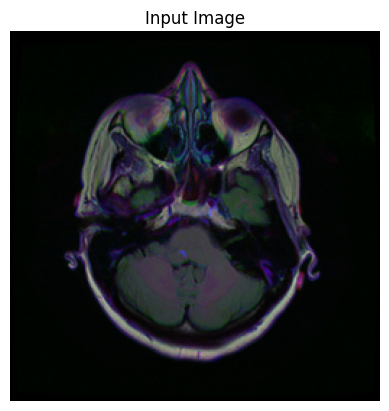

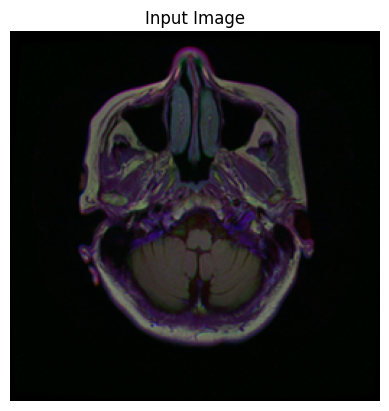

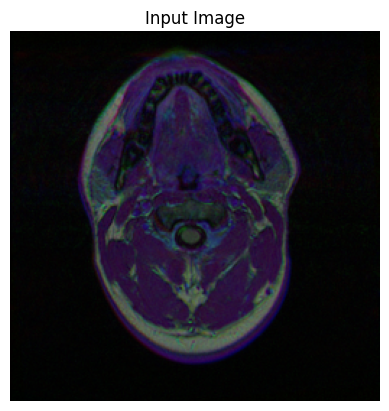

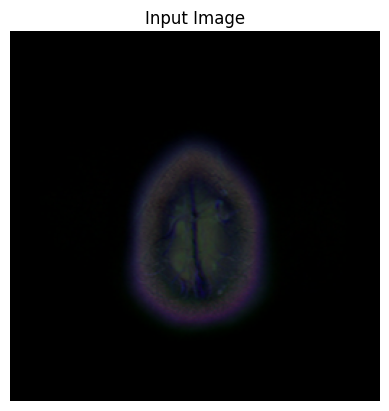

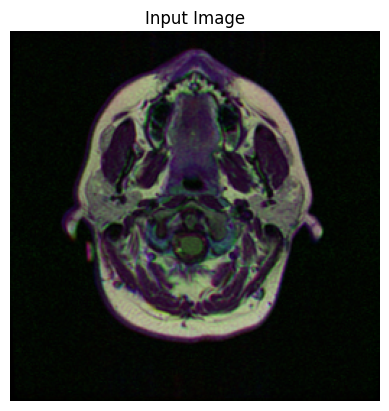

...

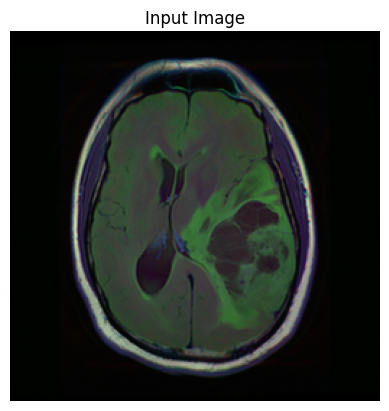

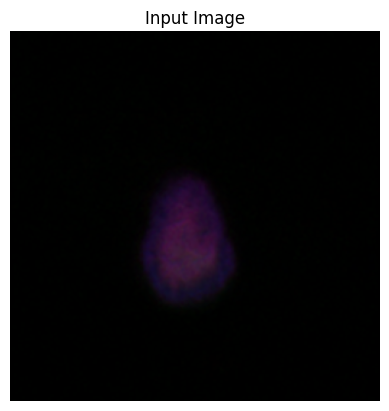

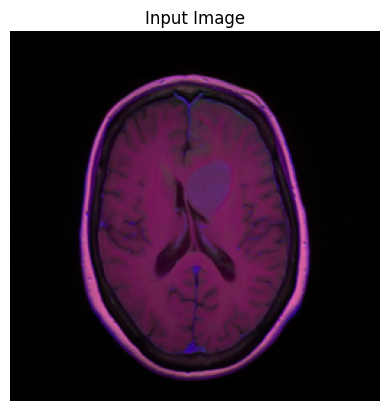

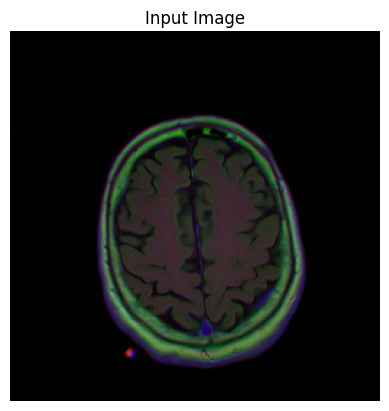

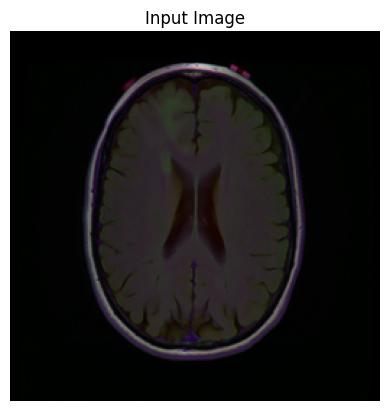

In [ ]:
# Denormalize for visualization
sample_images, sample_masks, sample_labels = next(iter(test_loader))
sample_images = sample_images.to(device)
mean = torch.tensor([0.485, 0.456, 0.406], device=device).view(1, 3, 1, 1)
std = torch.tensor([0.229, 0.224, 0.225], device=device).view(1, 3, 1, 1)
denorm_images = sample_images * std + mean

# Convert and display
for img in denorm_images.cpu():
    img_np = img.permute(1, 2, 0).numpy()
    plt.imshow(img_np)
    plt.title("Input Image")
    plt.axis('off')
    plt.show()


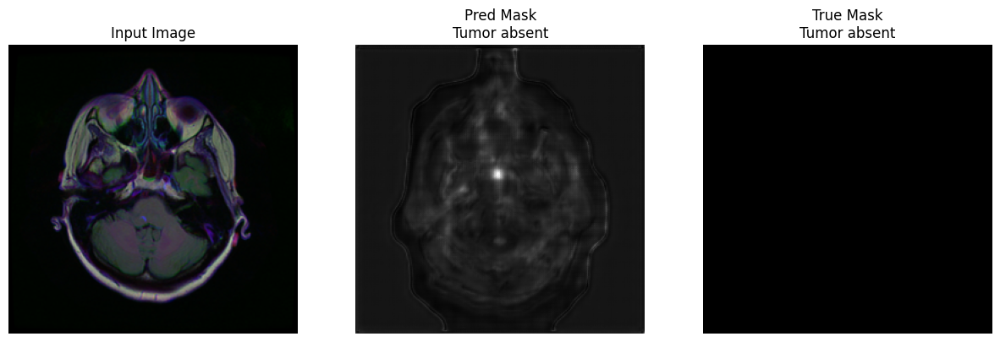

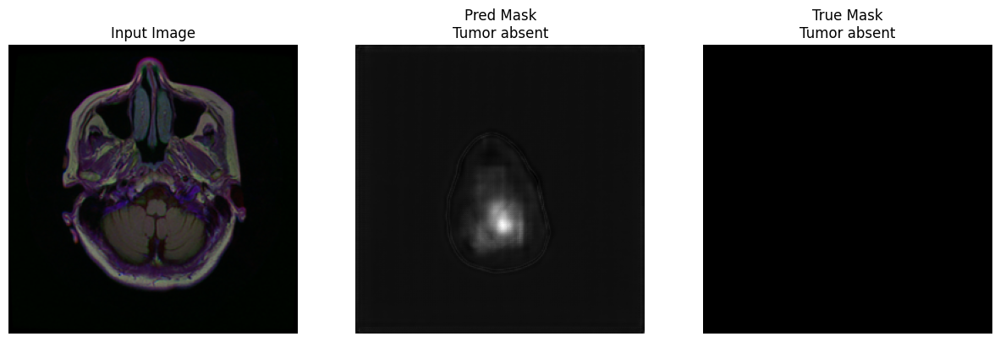

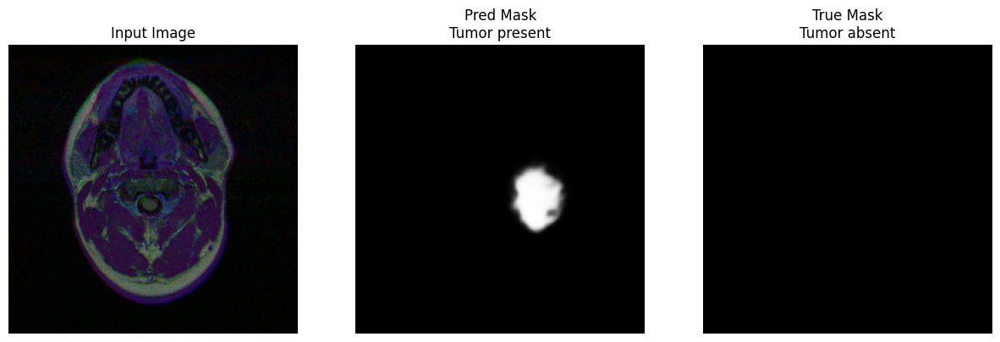

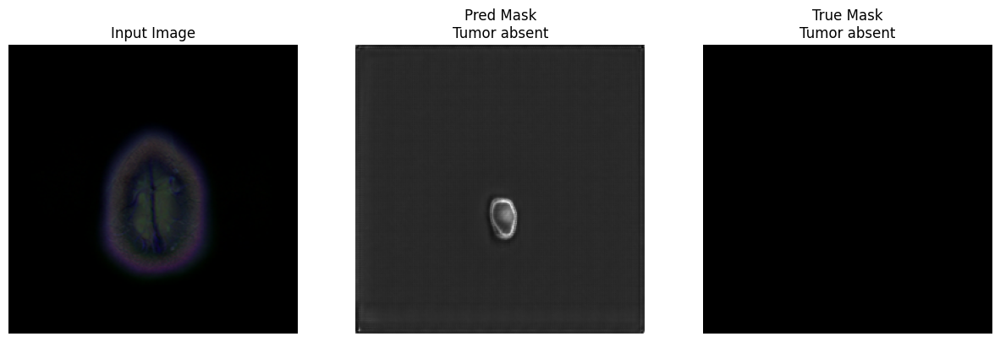

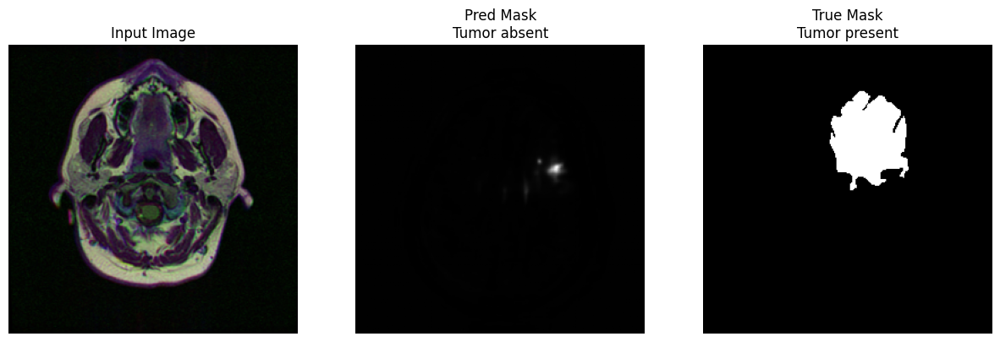

...

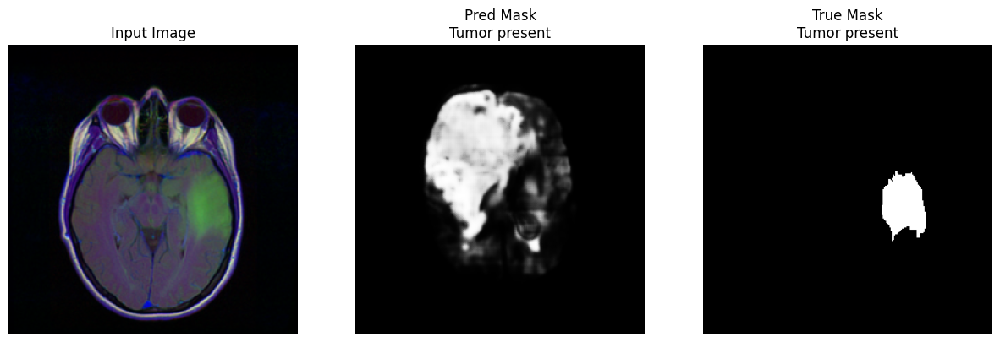

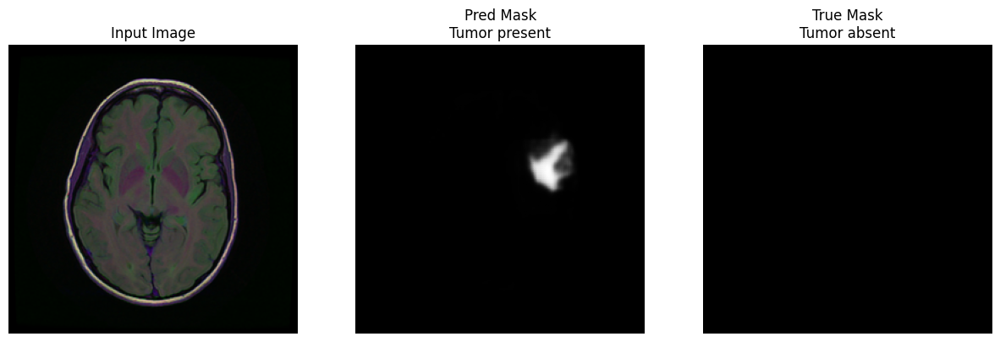

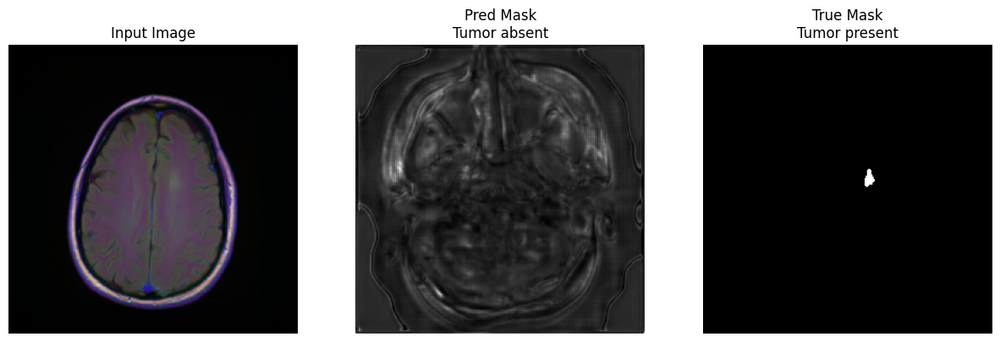

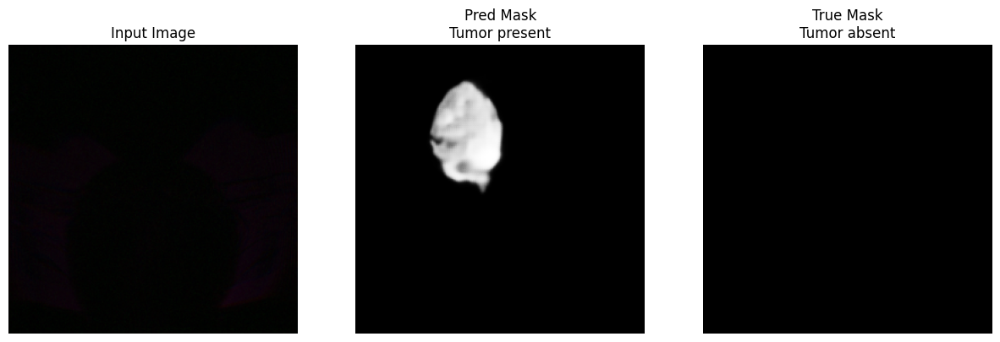

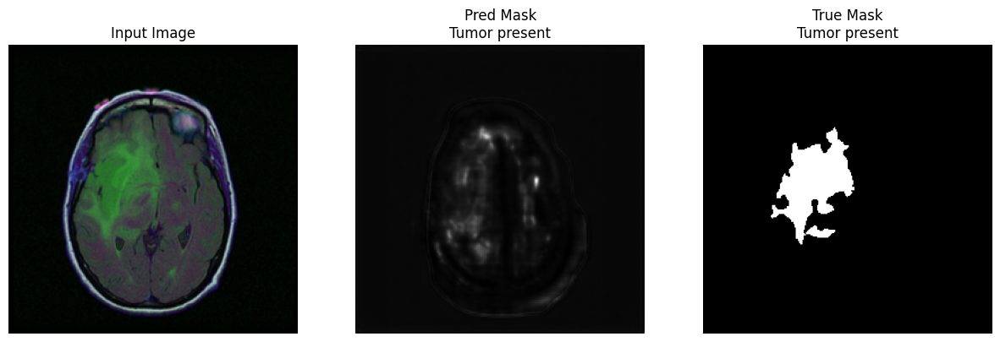

In [ ]:
# Get sigmoid probabilities and binarize
probs = torch.sigmoid(cls_pred).cpu()
pred_labels = (probs > 0.5).long().squeeze()    # shape [B]

true_labels = sample_labels.cpu().long().squeeze()  # shape [B]

for i, (img, pred_mask, true_mask) in enumerate(zip(denorm_images,
                                                   seg_pred,
                                                   sample_masks)):
    pred_str = "Tumor present" if pred_labels[i].item() == 1 else "Tumor absent"
    true_str = "Tumor present" if true_labels[i].item() == 1 else "Tumor absent"

    plt.figure(figsize=(15,5))

    # 1) Input image
    plt.subplot(1, 3, 1)
    img_np = img.permute(1, 2, 0).cpu().numpy()
    plt.imshow(img_np)
    plt.title("Input Image")
    plt.axis('off')

    # 2) Predicted mask + class
    plt.subplot(1, 3, 2)
    mask_np = pred_mask.detach().squeeze().cpu().numpy()    
    plt.imshow(mask_np, cmap='gray')
    plt.title(f"Pred Mask\n{pred_str}")
    plt.axis('off')

    # 3) Ground‑truth mask + class
    plt.subplot(1, 3, 3)
    true_np = true_mask.squeeze().cpu().numpy()             
    plt.imshow(true_np, cmap='gray')
    plt.title(f"True Mask\n{true_str}")
    plt.axis('off')

    plt.show()

tensor([[[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
          [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
          [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
          ...,
          [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
          [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
          [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

         [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
          [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
          [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
          ...,
          [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
          [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
          [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

         [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
          [-1.8044, -1.8044, -

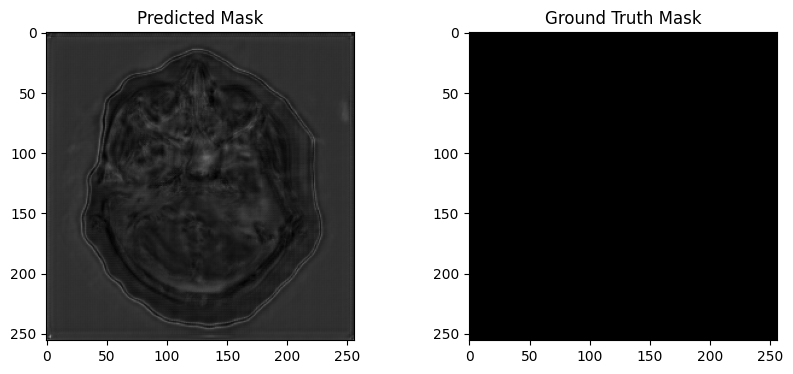

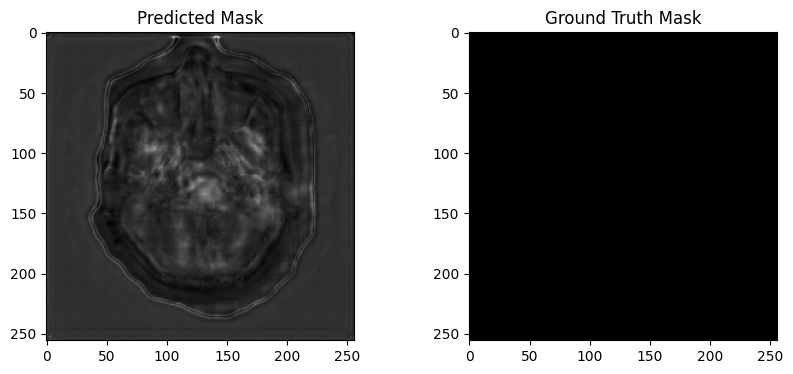

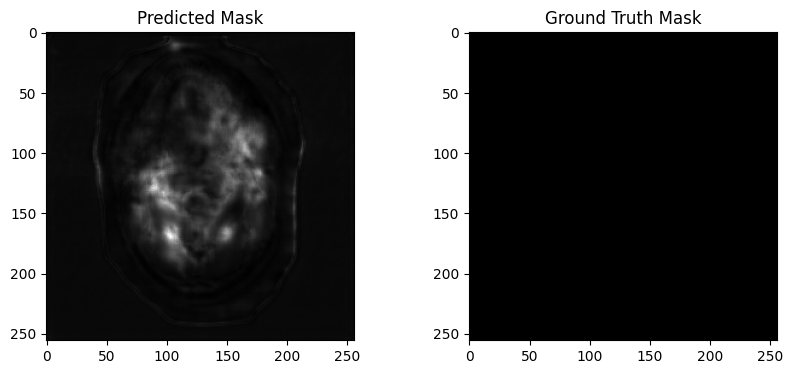

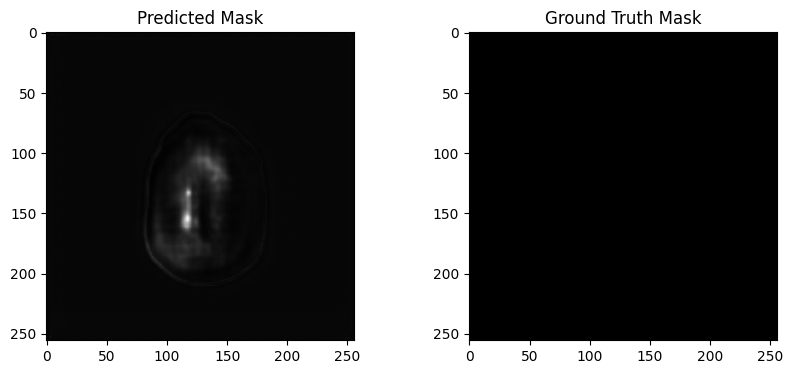

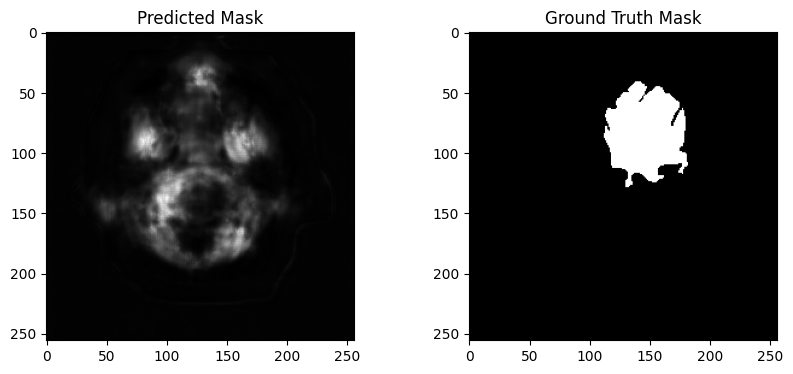

...

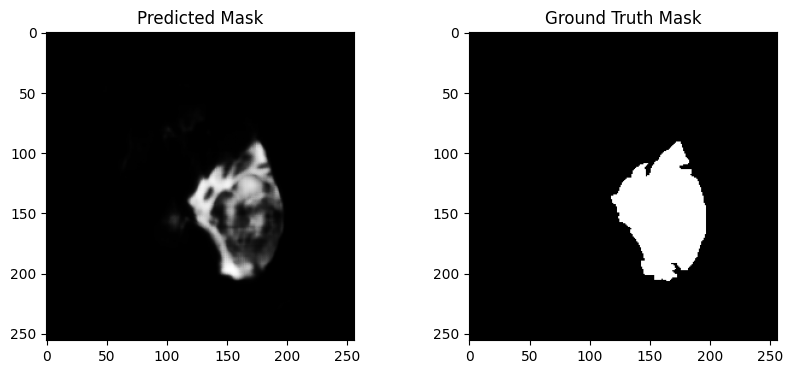

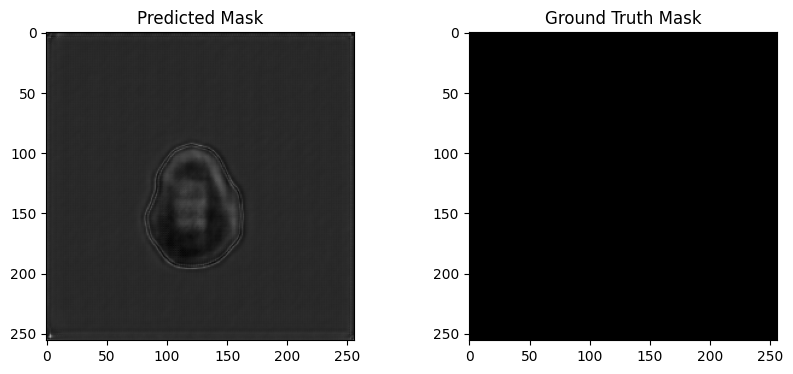

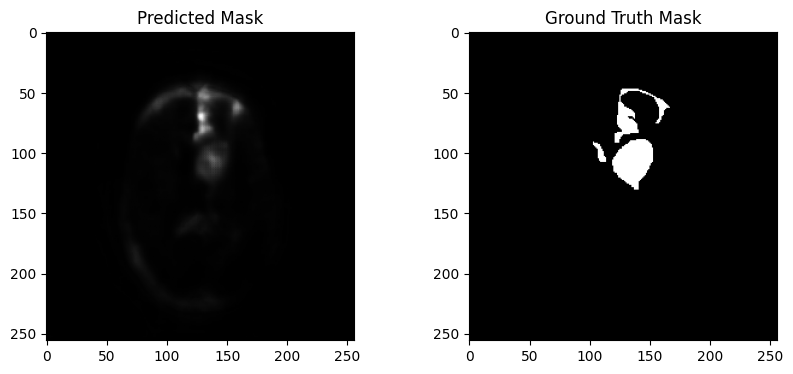

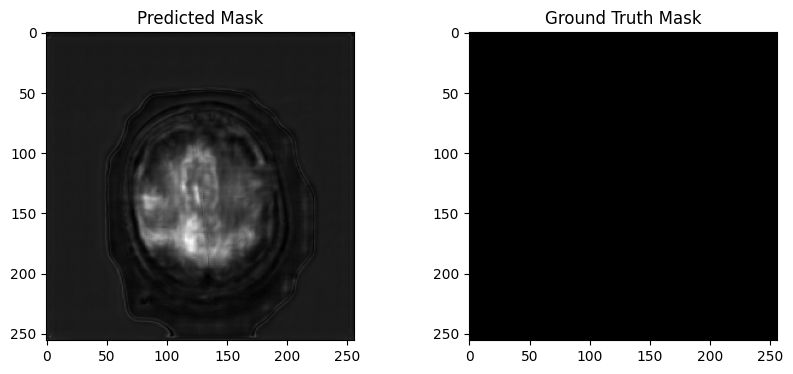

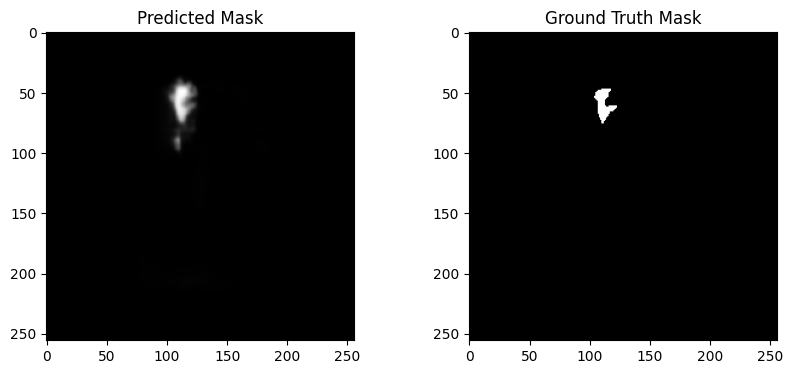

In [ ]:
with torch.no_grad():
    sample_images, sample_masks, sample_labels = next(iter(test_loader))
    sample_images = sample_images.to(device)
    print(sample_images)
    sample_masks = sample_masks.to(device)
    sample_labels = sample_labels.to(device).unsqueeze(1)
    predictions, cls_pred = model(sample_images)
    print(predictions.shape)
    for pred, mask in zip(predictions, sample_masks):
      plt.figure(figsize=(10, 4))

      plt.subplot(1, 2, 1)
      plt.imshow(pred.squeeze().cpu().numpy(), cmap='gray')
      plt.title('Predicted Mask')

      plt.subplot(1, 2, 2)
      plt.imshow(mask.squeeze().cpu().numpy(), cmap='gray')
      plt.title('Ground Truth Mask')

      plt.show()

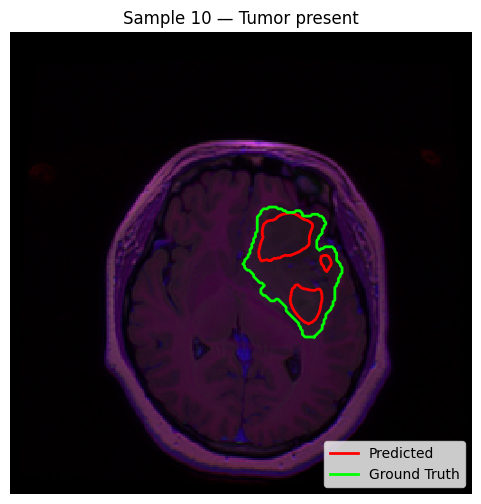

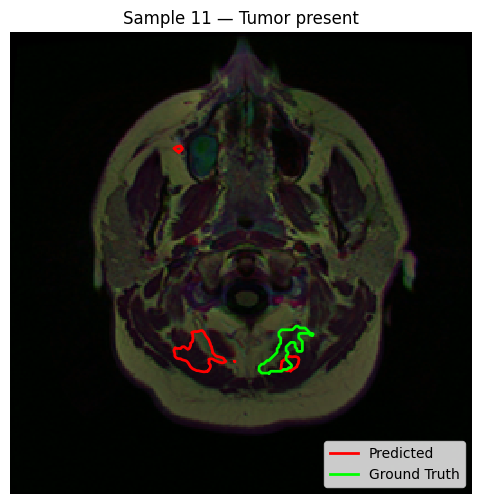

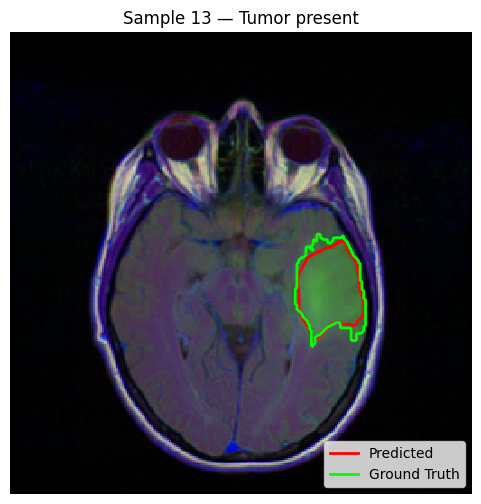

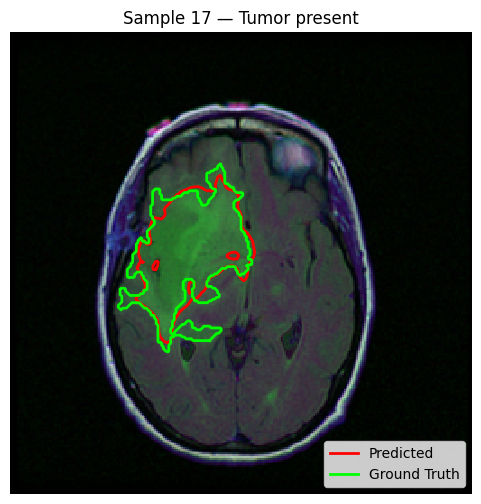

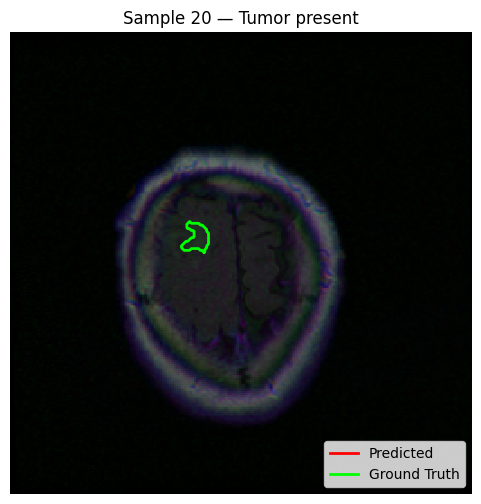

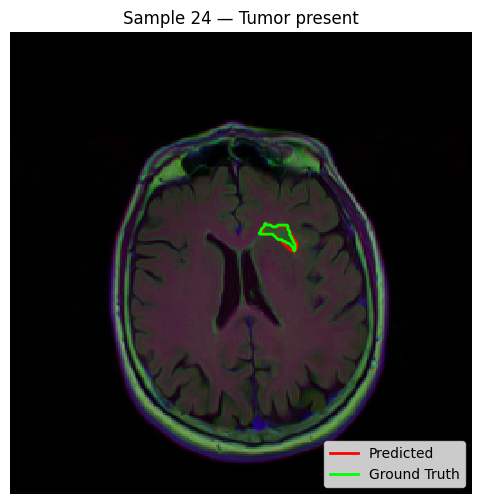

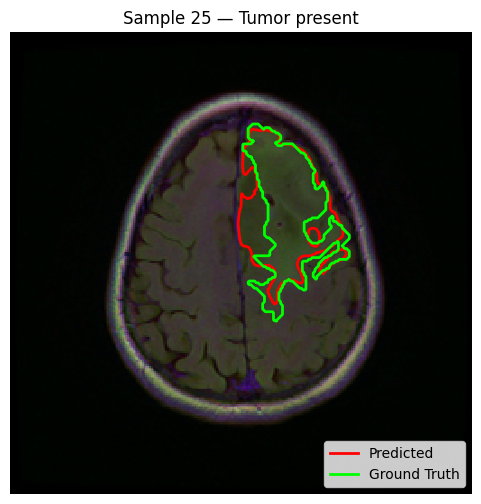

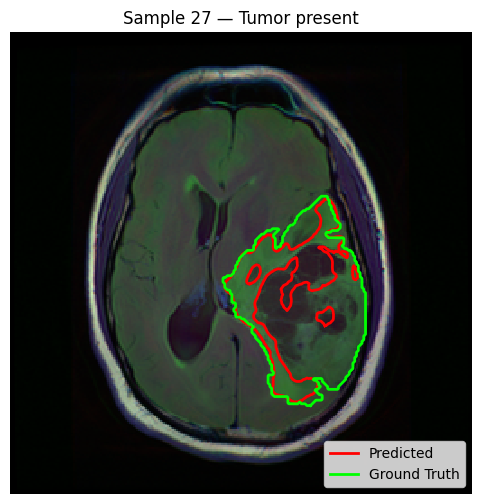

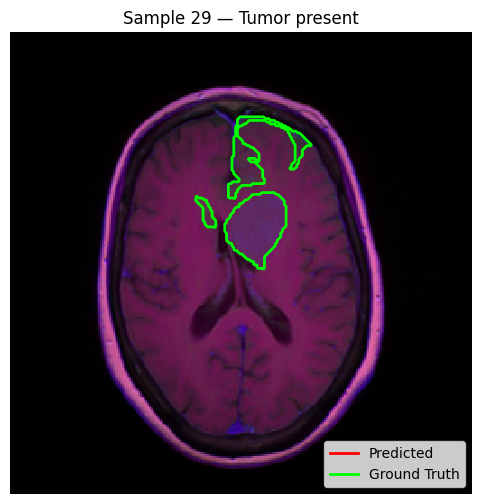

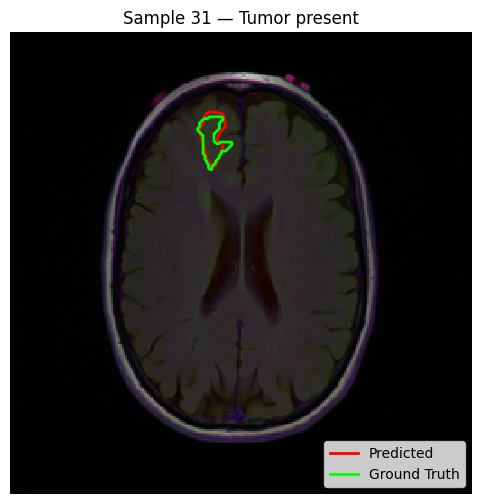

In [ ]:
import matplotlib.pyplot as plt
from skimage import measure

sample_images, sample_masks, sample_labels = next(iter(test_loader))
sample_images = sample_images.to(device)
sample_masks  = sample_masks.to(device)
sample_labels = sample_labels.to(device).unsqueeze(1)

with torch.no_grad():
    seg_pred, cls_pred = model(sample_images)

probs       = torch.sigmoid(cls_pred).cpu()
pred_labels = (probs > 0.5).long().squeeze()         # [B]
true_labels = sample_labels.cpu().long().squeeze()   # [B]

mean = torch.tensor([0.485, 0.456, 0.406], device=device).view(1,3,1,1)
std  = torch.tensor([0.229, 0.224, 0.225], device=device).view(1,3,1,1)
denorm_images = (sample_images * std + mean).cpu()   # [B,3,H,W]


for i in range(len(pred_labels)):
    if pred_labels[i].item() != 1:
        continue

    img = denorm_images[i].permute(1,2,0).numpy()
    pred_mask = seg_pred[i].detach().squeeze().cpu().numpy()
    true_mask = sample_masks[i].squeeze().cpu().numpy()

    # find contours at a constant value of 0.5
    pred_contours = measure.find_contours(pred_mask, 0.5)
    true_contours = measure.find_contours(true_mask, 0.5)

    plt.figure(figsize=(6,6))
    plt.imshow(img, interpolation='nearest')
    plt.axis('off')
    plt.title(f"Sample {i} — Tumor present")

    # overlay predicted contour in red
    for contour in pred_contours:
        plt.plot(contour[:,1], contour[:,0], linewidth=2, color='red', label='_nolegend_')
    # overlay ground-truth contour in green
    for contour in true_contours:
        plt.plot(contour[:,1], contour[:,0], linewidth=2, color='lime', label='_nolegend_')

    # add legend handles
    plt.plot([], [], color='red',  linewidth=2, label='Predicted')
    plt.plot([], [], color='lime', linewidth=2, label='Ground Truth')
    plt.legend(loc='lower right')
    plt.show()


In [ ]:
features = None
gradients = None

def forward_hook(module, inp, outp):
    global features
    features = outp  # [B, C, H, W]

def backward_hook(module, grad_in, grad_out):
    global gradients
    gradients = grad_out[0]  # same shape as features

In [ ]:
target_layer = model.dconv_down4  
target_layer.register_forward_hook(forward_hook)
target_layer.register_backward_hook(backward_hook)

In [ ]:
sample_images.shape

torch.Size([32, 3, 256, 256])

In [ ]:
# Forward pass on a single image
model.eval()
img_ind = 3
img = sample_images[img_ind].unsqueeze(0).to(device)
seg_pred, cls_logit = model(img)

# Compute gradient w.r.t. the “tumor present” logit
model.zero_grad()
cls_logit[:, 0].backward(retain_graph=True)

# Compute weights: global‐average‐pool the gradients over H×W
weights = gradients.mean(dim=(2,3), keepdim=True)  # [1, C, 1, 1]

# Build CAM and ReLU
cam = torch.relu((weights * features).sum(dim=1, keepdim=True))  # [1, 1, H, W]
cam = torch.nn.functional.interpolate(cam, size=(256,256), mode='bilinear', align_corners=False)
cam = cam.detach().squeeze().cpu().numpy() # Detach the tensor from the computation graph before converting it to a NumPy array.

/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1830: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


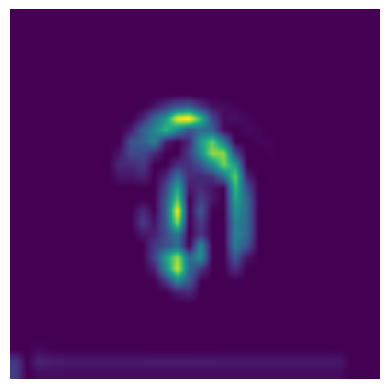

In [ ]:
plt.imshow(cam, cmap='viridis')
plt.axis('off')
plt.show()

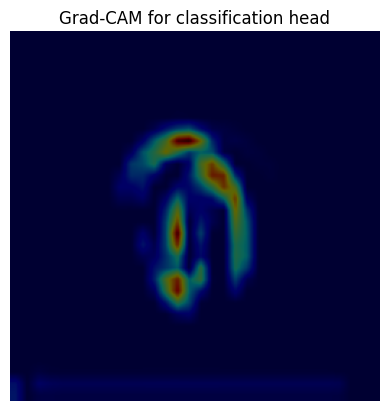

In [ ]:
heatmap = (cam - cam.min())/(cam.max()-cam.min())

img_np = img.cpu().numpy()

plt.imshow(img_np.squeeze(0).transpose(1, 2, 0)) 
plt.imshow(heatmap, cmap='jet', alpha=0.4)  
plt.title("Grad‑CAM for classification head")
plt.axis('off')
plt.show()

In [ ]:
model.transformer_encoder.seq[0]

Residual(
  (fn): MHAttention(
    (heads): ModuleList(
      (0-3): 4 x LinearAttentionHead(
        (E): Linear(in_features=256, out_features=64, bias=True)
        (F): Linear(in_features=256, out_features=64, bias=True)
        (dropout): Dropout(p=0.1, inplace=False)
      )
    )
    (to_q): ModuleList(
      (0-3): 4 x Linear(in_features=512, out_features=512, bias=False)
    )
    (to_k): ModuleList(
      (0-3): 4 x Linear(in_features=512, out_features=512, bias=False)
    )
    (to_v): ModuleList(
      (0-3): 4 x Linear(in_features=512, out_features=512, bias=False)
    )
    (w_o): Linear(in_features=2048, out_features=512, bias=True)
    (mh_dropout): Dropout(p=0.1, inplace=False)
  )
  (norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
)

In [ ]:
model.transformer_encoder.seq[0].fn.w_o

Linear(in_features=2048, out_features=512, bias=True)

In [ ]:
model.transformer_encoder.seq[0].fn.w_o.weight.shape

torch.Size([512, 2048])

In [ ]:
model.transformer_encoder.seq[0].fn.heads

ModuleList(
  (0-3): 4 x LinearAttentionHead(
    (E): Linear(in_features=256, out_features=64, bias=True)
    (F): Linear(in_features=256, out_features=64, bias=True)
    (dropout): Dropout(p=0.1, inplace=False)
  )
)

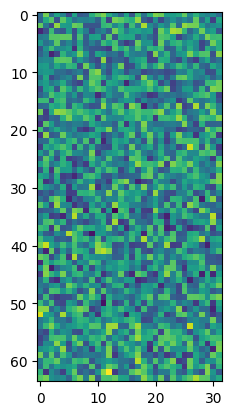

In [ ]:
attn_map = model.transformer_encoder.seq[0].fn.w_o.weight[0].view(64, 32).detach().cpu().numpy()
plt.imshow(attn_map, cmap='viridis')

# Export model to ONNX

In [ ]:
!pip -q install onnx
!pip -q install onnxruntime

In [ ]:
import torch.onnx
import onnx
import onnxruntime

bs = 1
height, width = 256, 256
onnx_path = '/content/drive/MyDrive/Results_n_Outputs/best_model.onnx'
dummy_input = torch.randn(bs, 3, height, width).to(device)
torch_out = model(dummy_input)

In [ ]:
torch.onnx.export(
    model,
    dummy_input,
    onnx_path,
    input_names=['input'],
    output_names=['seg_out', 'cls_out'],
    opset_version=11,
    do_constant_folding=True,
    export_params=True
)

print(f"Model exported to ONNX format at: {onnx_path}")

/usr/local/lib/python3.11/dist-packages/linformer_pytorch/linformer_pytorch.py:317: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
  assert n == self.input_size, "This tensor is of the wrong size. Dimension 1 has to match the `input_size` flag"
/usr/local/lib/python3.11/dist-packages/linformer_pytorch/linformer_pytorch.py:318: TracerWarning: Converting a tensor to a Python boolean might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
  assert c == self.channels, "This tensor is of the wrong size. Dimension 2 has to match the `channels` flag"
/usr/local/lib/python3.11/dist-packages/linformer_pytorch/linformer_pytorch.py

Model exported to ONNX format at: /content/drive/MyDrive/Results_n_Outputs/best_model.onnx


# GRADIO

In [ ]:
test_model = U_Net().to(device)
checkpoint_path = "/content/drive/MyDrive/Results_n_Outputs/best_model.pth"
test_model.load_state_dict(torch.load(checkpoint_path, map_location=device))
test_model.eval()

U_Net(
  (dconv_down1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
  )
  (dconv_down2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
  )
  (dconv_down3): Sequential(
    (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1

In [ ]:
preprocess = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

In [ ]:
def denormalize(tensor):
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3,1,1)
    std  = torch.tensor([0.229, 0.224, 0.225]).view(3,1,1)
    return (tensor * std + mean).clamp(0,1)

In [ ]:
def predict(image: np.ndarray):
    """
    Input:   image as a HxWx3 numpy array (0–255)
    Returns: segmentation mask as an HxW array (0–1 float),
             and a string “Tumor present/absent”
    """
    # PIL→Tensor, add batch dim, send to device
    img = Image.fromarray(image.astype('uint8'), 'RGB')
    x   = preprocess(img).unsqueeze(0).to(device)

    # Forward pass
    with torch.no_grad():
        seg_out, cls_out = test_model(x)
        seg_mask = seg_out.squeeze().cpu().numpy()         # HxW float mask
        prob     = torch.sigmoid(cls_out).item()
        label    = "Tumor present" if prob > 0.5 else "Tumor absent"

    # Return mask and label
    return seg_mask, label

In [ ]:
iface = gr.Interface(
    fn=predict,
    inputs=gr.Image(type="numpy", label="Input MRI Scan"),
    outputs=[
        gr.Image(type="numpy", label="Predicted Mask"),
        gr.Label(num_top_classes=1, label="Tumor Classification")
    ],
    title="U‑Net Transformer Tumor Segmentation & Classification",
    description="Upload an image, get back a tumor mask and presence/absence label."
)

iface.launch(share=True)

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://150805b551a85e0b72.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
